In [1]:
import torch
from IPython.display import Audio, display
import numpy as np
import librosa as li
import soundfile as sf
import random
import matplotlib.pyplot as plt
import math

This notebook shows how we calculated the magnitude of the encoder output in the latent space.

In [3]:
maestro_ones_ts = "/opt/research/AudioSteno/datasets/maestrowithones/maestroWithOnes.ts"
maestro_no_ones_ts = "/opt/research/AudioSteno/datasets/maestro/train/maestro_train_original_e18d54798e/version_0/checkpoints/maestro_train_original_e18d54798e.ts"

In [25]:
def generate_from_audio(model_dir, audio_loc):
    
    model = torch.jit.load(model_dir).eval()
    x, sr = li.load(audio_loc, sr=44100)
    x = torch.from_numpy(x).reshape(1,1,-1)
    z = model.encode(x)
    #x_hat = model.decode(z).detach().numpy().reshape(-1)
    #sr = 44100

    return z

In [35]:
audio = "/opt/research/AudioSteno/datasets/maestrowithones/audio/MIDI-Unprocessed_11_R1_2011_MID--AUDIO_R1-D4_10_Track10_wav.wav"
display(Audio(audio, rate=44100))

In [33]:
encoder_output = generate_from_audio(maestro_ones_ts, audio)

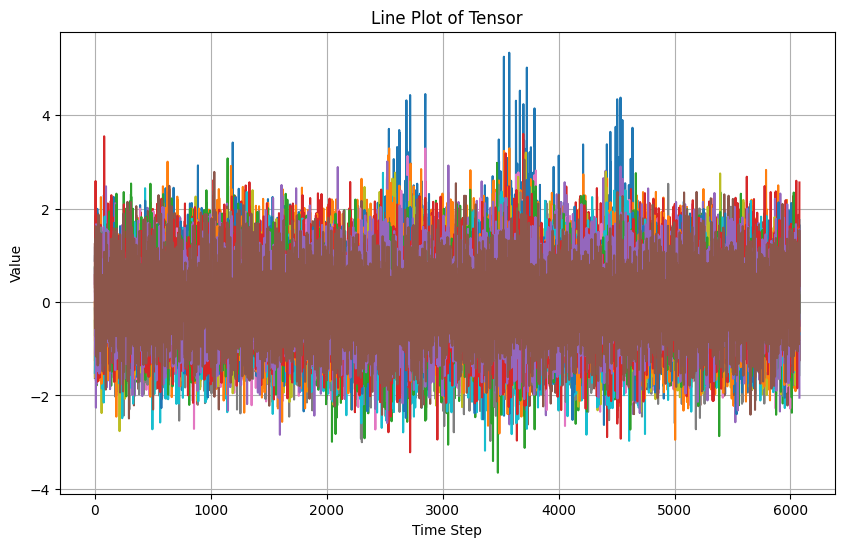

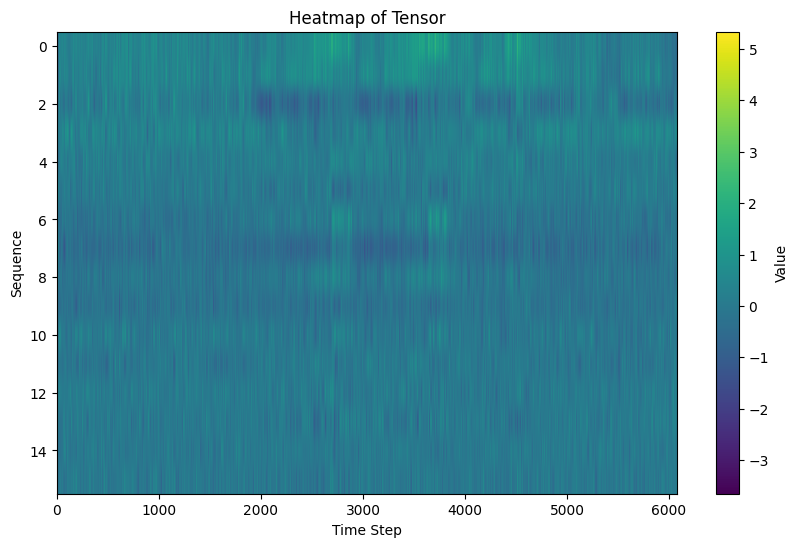

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'tensor' is your tensor of shape (1, 16, 2000)
tensor = encoder_output.numpy()

# Line plot
plt.figure(figsize=(10, 6))
for i in range(16):
    plt.plot(tensor[0, i, :])
plt.title('Line Plot of Tensor')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.grid(True)
plt.show()

# Heatmap
plt.figure(figsize=(10, 6))
plt.imshow(tensor[0], aspect='auto', cmap='viridis')
plt.colorbar(label='Value')
plt.title('Heatmap of Tensor')
plt.xlabel('Time Step')
plt.ylabel('Sequence')
plt.show()


torch.Size([1, 16, 6078])


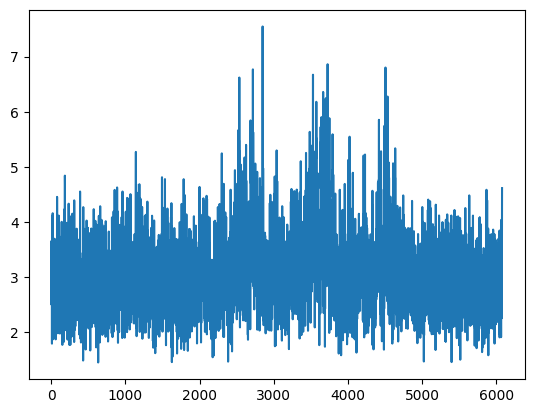

In [71]:
def calculate_distance(encoder_output):
    print(encoder_output.shape)
    X = encoder_output
    total = 0
    mags = torch.sqrt(torch.sum(X[0, :, :]**2, dim=0))

    plt.plot(mags)
calculate_distance(encoder_output=encoder_output)

In [67]:
59916/6078

9.857847976307996